## Table of Contents
1. [Importing dependencies](#1)
2. [Importing dataset](#2)
3. [Preprocessing the Text](#3)
4. [Analysing the data](#4)
5. [Splitting the data](#5)
6. [Creating Word Embeddings](#6)
7. [Tokenizing and Padding datasets](#7)
8. [Creating Embedding matrix](#8)
9. [Creating the Model](#9)
10. [Training the Model](#10)
11. [Evaluating Model](#11)
12. [Saving the Model](#12)


## <a id="1">Importing Dependencies</a>

In [ ]:
# Utilities
import re
import pickle
import numpy as np
import pandas as pd

# Plot libraries
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
import tensorflow as tf

# Check for TensorFlow GPU access
print(f"TensorFlow has access to the following devices:\n{tf.config.list_physical_devices()}")

# See TensorFlow version
print(f"TensorFlow version: {tf.__version__}")

TensorFlow has access to the following devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TensorFlow version: 2.8.0


## <a id="2">Importing Dataset</a>
The dataset being used is the **sentiment140 dataset**. It contains 1,600,000 tweets extracted using the **Twitter API**. The tweets have been annotated **(0 = Negative, 4 = Positive)** and they can be used to detect sentiment.
 
**[The training data isn't perfectly categorised as it has been created by tagging the text according to the emoji present. So, any model built using this dataset may have lower than expected accuracy, since the dataset isn't perfectly categorised.]**

**It contains the following 6 fields:**
1. **sentiment**: the polarity of the tweet *(0 = negative, 4 = positive)*
2. **ids**: The id of the tweet *(2087)*
3. **date**: the date of the tweet *(Sat May 16 23:58:44 UTC 2009)*
4. **flag**: The query (lyx). If there is no query, then this value is NO_QUERY.
5. **user**: the user that tweeted *(robotickilldozr)*
6. **text**: the text of the tweet *(Lyx is cool)*

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# Importing the dataset
DATASET_COLUMNS  = ["sentiment", "ids", "date", "flag", "user", "text"]
DATASET_ENCODING = "ISO-8859-1"
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/training.1600000.processed.noemoticon.csv',
                      encoding=DATASET_ENCODING , names=DATASET_COLUMNS)
df.head()

,sentiment,ids,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


We require only the **sentiment** and **text** fields, so we discard the rest.

Furthermore, we're remaping the **sentiment** field so that it has new values to reflect the sentiment. **(0 = Negative, 1 = Positive)**

In [ ]:
import copy

In [ ]:
dataset = copy.deepcopy(df)

In [ ]:
# Removing the unnecessary columns.
dataset = dataset[['sentiment','text']]

# Replacing the values.
dataset['sentiment'] = dataset['sentiment'].replace(4,1)

We're **plotting the distribution** for the dataset to see whether we have equal number of positive and negatives tweets or not.

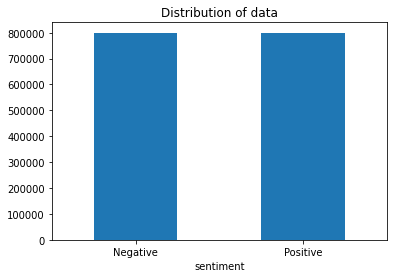

In [ ]:
ax = dataset.groupby('sentiment').count().plot(kind='bar', title='Distribution of data',
                                               legend=False)
ax = ax.set_xticklabels(['Negative','Positive'], rotation=0)

As we can see from the graphs, we have equal number of Positive/Negative tweets. Both equaling to 800,000 tweets. This means our dataset is **not skewed**.

In [ ]:
dataset["sentiment"].unique()

array([0, 1])

## <a id="3">Preprocessing the Text</a>
**Text Preprocessing** is traditionally an important step for **Natural Language Processing (NLP)** tasks. It transforms text into a more digestible form so that deep learning algorithms can perform better.

Tweets usually contains a lot of information apart from the text, like mentions, hashtags, urls, emojis or symbols. Since normally, NLP models cannot parse those data, we need to clean up the tweet and replace tokens that actually contains meaningful information for the model.

**The Preprocessing steps taken are:**
1. **Lower Casing:** Each text is converted to lowercase.
2. **Replacing URLs:** Links starting with **'http' or 'https' or 'www'** are replaced by **'<url\>'**.
3. **Replacing Usernames:** Replace @Usernames with word **'<user\>'**. [eg: '@Kaggle' to '<user\>'].
4. **Replacing Consecutive letters:** 3 or more consecutive letters are replaced by 2 letters. [eg: 'Heyyyy' to 'Heyy']
5. **Replacing Emojis:** Replace emojis by using a regex expression. [eg: ':)' to '<smile\>']
6. **Replacing Contractions:** Replacing contractions with their meanings. [eg: "can't" to 'can not']
7. **Removing Non-Alphabets:** Replacing characters except Digits, Alphabets and pre-defined Symbols with a space.

As much as the preprocessing steps are important, the actual sequence is also important while cleaning up the text. For example, removing the punctuations before replacing the urls means the regex expression cannot find the urls. Same with mentions or hashtags. So make sure, the actual sequence of cleaning makes sense.

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tag import pos_tag
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
# stop_wrds = stopwords.words('english')

In [ ]:
# for i in dataset['text'].iloc[:1]:
#         print(i.split())

In [ ]:
# for i in dataset['text'].iloc[:1]:
#     for w in i.split():
#         if w not in stop_wrds:
#             print(w)
    

In [ ]:
# Reading contractions.csv and storing it as a dict.
contractions = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/contractions.csv', index_col='Contraction')
contractions.index = contractions.index.str.lower()
contractions.Meaning = contractions.Meaning.str.lower()
contractions_dict = contractions.to_dict()['Meaning']

# Defining regex patterns.
urlPattern        = r"((http://)[^ ]*|(https://)[^ ]*|(www\.)[^ ]*)"
userPattern       = '@[^\s]+'
hashtagPattern    = '#[^\s]+'
alphaPattern      = "[^a-z0-9<>]"
sequencePattern   = r"(.)\1\1+"
seqReplacePattern = r"\1\1"

# Defining regex for emojis
smileemoji        = r"[8:=;]['`\-]?[)d]+"
sademoji          = r"[8:=;]['`\-]?\(+"
neutralemoji      = r"[8:=;]['`\-]?[\/|l*]"
lolemoji          = r"[8:=;]['`\-]?p+"

def preprocess_apply(tweet):

    tweet = tweet.lower()
    
    for contraction, replacement in contractions_dict.items():
        tweet = tweet.replace(contraction, replacement)

    # Replace all URls with '<url>'
    tweet = re.sub(urlPattern,'<url>',tweet)
    # Replace @USERNAME to '<user>'.
    tweet = re.sub(userPattern,'<user>', tweet)
    
    # Replace 3 or more consecutive letters by 2 letter.
    tweet = re.sub(sequencePattern, seqReplacePattern, tweet)

    # Replace all emojis.
    tweet = re.sub(r'<3', '<heart>', tweet)
    tweet = re.sub(smileemoji, '<smile>', tweet)
    tweet = re.sub(sademoji, '<sadface>', tweet)
    tweet = re.sub(neutralemoji, '<neutralface>', tweet)
    tweet = re.sub(lolemoji, '<lolface>', tweet)

#     for contraction, replacement in contractions_dict.items():
#         tweet = tweet.replace(contraction, replacement)

    # Remove non-alphanumeric and symbols
    tweet = re.sub(alphaPattern, ' ', tweet)

    # Adding space on either side of '/' to seperate words (After replacing URLS).
    tweet = re.sub(r'/', ' / ', tweet)
    return tweet

Cleaning up the tweet text and storing it in **"processed_text"** field in the dataframe.

In [ ]:
%%time
dataset['processed_text'] = dataset.text.apply(preprocess_apply)

CPU times: user 1min 29s, sys: 534 ms, total: 1min 30s
Wall time: 1min 30s


Let's have a look and see what the processed text looks like.

In [ ]:
count=0
for row in dataset.itertuples():
    print("Text:", row[2])
    print("Processed:", row[3], '\n')
    count+=1
    if count>15:
        break

Text: @switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer.  You shoulda got David Carr of Third Day to do it. ;D
Processed: <user> <url>   aww  that is a bummer   you should have got david carr of third day to do it  <smile> 

Text: is upset that he can't update his Facebook by texting it... and might cry as a result  School today also. Blah!
Processed: is upset that he can not update his facebook by texting it   and might cry as a result  school today also  blah  

Text: @Kenichan I dived many times for the ball. Managed to save 50%  The rest go out of bounds
Processed: <user> i dived many times for the ball  managed to save 50   the rest go out of bounds 

Text: my whole body feels itchy and like its on fire 
Processed: my whole body feels itchy and like its on fire  

Text: @nationwideclass no, it's not behaving at all. i'm mad. why am i here? because I can't see you all over there. 
Processed: <user> no  it is not behaving at all  i am mad  why am i here  because i can not

## <a id="4">Analysing the Data</a>
Now we're going to analyse the preprocessed data to get an understanding of it. We'll plot **Word Clouds** for **Positive and Negative** tweets from our dataset and see which words occur the most.

In [ ]:
processedtext = list(dataset['processed_text'])
data_pos = processedtext[800000:]
data_neg = processedtext[:800000]

### Word-Cloud for Positive tweets.

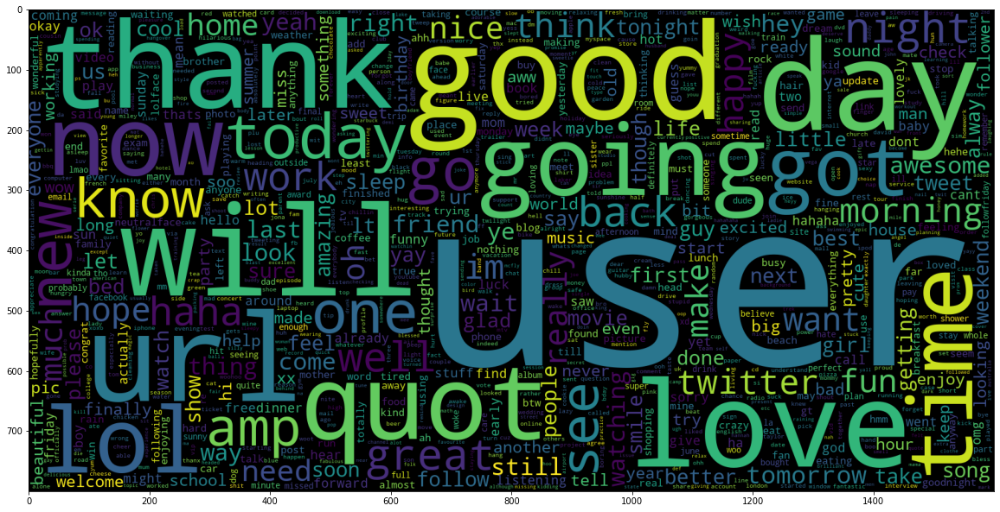

In [ ]:
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
              collocations=False).generate(" ".join(data_pos))
plt.figure(figsize = (20,20))
plt.imshow(wc)

### Word-Cloud for Negative tweets.

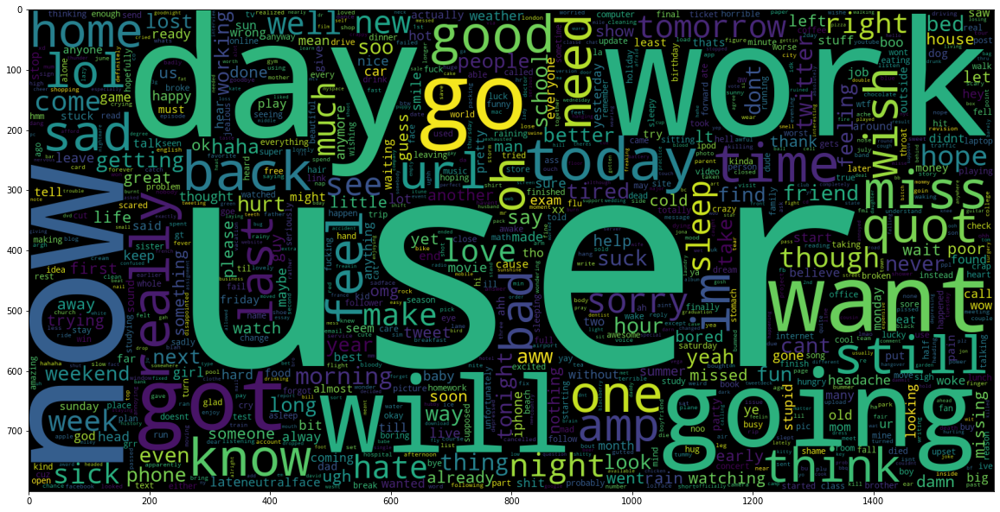

In [ ]:
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neg))
plt.figure(figsize = (20,20))
plt.imshow(wc)

## <a id="5">Splitting the Data</a>

Machine Learning models are trained and tested on different sets of data. This is done so to reduce the chance of the model overfitting to the training data, i.e it fits well on the training dataset but a has poor fit with new ones.

**sklearn.model_selection.train_test_split** shuffles the dataset and splits it into train and test dataset.

The Pre-processed Data is divided into 2 sets of data: 
1. **Training Data:** The dataset upon which the model would be trained on. Contains 95% data.
2. **Test Data:** The dataset upon which the model would be tested against. Contains 5% data.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_data, test_data = train_test_split(dataset, test_size=0.1,
                                         random_state=0, stratify=dataset['sentiment']) # Splits Dataset into Training and Testing set
print("Train Data size:", len(train_data))
print("Test Data size", len(test_data))

Train Data size: 1440000
Test Data size 160000


In [ ]:
#train_data

In [ ]:
#test_data

## <a id="6">Creating Word Embeddings using Word2Vec model</a>

**Word embedding** is one of the most popular representation of document vocabulary. It is capable of capturing context of a word in a document, semantic and syntactic similarity, relation with other words, etc. Loosely speaking, word embeddings are **vector representations** of a particular word.

**Word2Vec** was developed by Google and is one of the most popular technique to learn word embeddings using shallow neural network.
Word2Vec can create word embeddings using two methods (both involving Neural Networks): **Skip Gram** and **Common Bag Of Words (CBOW)**.

In [ ]:
from gensim.models import Word2Vec

Embedding_dimensions = 100

# Creating Word2Vec training dataset.
Word2vec_train_data = list(map(lambda x: x.split(), train_data['processed_text']))

In [ ]:
#Word2vec_train_data

**Word2Vec()** function creates and trains the word embeddings using the data passed.

**Training Parameters**
* **size:** The number of dimensions (N) that the Word2Vec maps the words onto. Bigger size values require more training data, but can lead to better (more accurate) models.
* **workers:** Specifies the number of worker threads for training parallelization, to speed up training.
* **min_count:** min_count is for pruning the internal dictionary. Words that appear only once or twice in a billion-word corpus are probably uninteresting typos and garbage. In addition, there’s not enough data to make any meaningful training on those words, so it’s best to ignore them.

In [ ]:
%%time

# Defining the model and training it.
word2vec_model = Word2Vec(Word2vec_train_data,
                 size=Embedding_dimensions,
                 workers=8,
                 min_count=5)

#print("Vocabulary Length:", len(word2vec_model.wv.key_to_index))

CPU times: user 4min 9s, sys: 2.3 s, total: 4min 11s
Wall time: 2min 18s


## <a id="7">Tokenizing and Padding datasets</a>

**Tokenization** is a common task in **Natural Language Processing (NLP)**. It’s a fundamental step in both traditional NLP methods like **Count Vectorizer** and Advanced Deep Learning-based architectures like **Transformers**.

**Tokenization** is a way of separating a piece of text into smaller units called **tokens**. Here, tokens can be either words, characters, or subwords. Hence, tokenization can be broadly classified into 3 types – word, character, and subword (n-gram characters) tokenization.

All the neural networks require to have inputs that have the same shape and size. However, when we pre-process and use the texts as inputs for our model e.g. LSTM, not all the sentences have the same length. We need to have the inputs with the same size, this is where the **padding** is necessary.

**Padding** is the process by which we can add padding tokens at the start or end of a sentence to increase it's length upto the required size. If required, we can also drop some words to reduce to the specified length.


* **Tokenizer:** Tokenizes the dataset into a list of tokens.
* **pad_sequences:** Pads the tokenized data to a certain length.

The **input_length** has been set to 60. This will be the length after the data is tokenized and padded.

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
input_length=60

In [ ]:
tokenizer = Tokenizer(filters="", lower=False, oov_token="<oov>")
tokenizer.fit_on_texts(train_data['processed_text'])

word_index = tokenizer.word_index
# vocab_size = len(tokenizer.word_index) + 1
# print("Vocabulary Size :", vocab_size)

In [ ]:
#word_index

In [ ]:
vocab_length = 60000
#tokenizer.num_words = vocab_length
print("Tokenizer vocab length:", vocab_length)

Tokenizer vocab length: 60000


Tokenizing the **X_train and X_test** dataset and padding them to the length **'input_length'**.

The tokenized list is **pre-padded**, i.e padding tokens are added to the start. After padding, the length of the data would be equal to **'input_length'**.

In [ ]:
X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.processed_text),
                        maxlen = input_length)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.processed_text),
                       maxlen = input_length)

print("Training X Shape:",X_train.shape)
print("Testing X Shape:",X_test.shape)

Training X Shape: (1440000, 60)
Testing X Shape: (160000, 60)


In [ ]:
# type(X_train)

In [ ]:
# X_train[5]

In [ ]:
# X_train[5].shape

In [ ]:
labels = dataset.sentiment.unique().tolist()
labels

[0, 1]

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
encoder = LabelEncoder()
encoder.fit(train_data.sentiment.to_list())

y_train = encoder.transform(train_data.sentiment.to_list())
y_test = encoder.transform(test_data.sentiment.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)
type(y_test)

y_train shape: (1440000, 1)
y_test shape: (160000, 1)


numpy.ndarray

In [ ]:
# for word, token in tokenizer.word_index.items():
#     print(word, token)

## <a id="8">Creating Embedding Matrix</a>

**Embedding Matrix** is a maxtrix of all words and their corresponding embeddings. We use embedding matrix in an **Embedding layer** in our model to embedded a token into it's vector representation, that contains information regarding that token or word.

We get the embedding vocabulary from the tokenizer and the corresponding vectors from the Embedding Model, which in this case is the Word2Vec model.

**Shape of Embedding matrix** is usually the **Vocab Length * Embedding Dimension.**

In [ ]:
embedding_matrix = np.zeros((vocab_length, Embedding_dimensions))

for word, token in tokenizer.word_index.items():
    if word2vec_model.wv.__contains__(word):
        embedding_matrix[token] = word2vec_model.wv.__getitem__(word)

print("Embedding Matrix Shape:", embedding_matrix.shape)

Embedding Matrix Shape: (60000, 100)


In [ ]:
#embedding_matrix[45]

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Bidirectional, GlobalMaxPool1D, Dense, LSTM, Conv1D, Embedding, Dropout

## <a id="9">Creating the Model</a>

There are different approches which we can use to build our Sentiment analysis model. We're going to build a deeplearning **Sequence model.**

**Sequence model** are very good at getting the context of a sentence, since it can understand the meaning rather than employ techniques like counting positive or negative words like in a **Bag-of-Words model**.

### Model Architecture

1) **Embedding Layer:** Layer responsible for converting the tokens into their vector representation that is generated by Word2Vec model. We're using the predefined layer from Tensorflow in out model.

**Arguments -**
* **input_dim**: Size of the vocabulary.
* **output_dim**: Dimension of the dense embedding.
* **weights**: Initiazises the embedding matrix.
* **trainable**: Specifies whether the layer is trainable or not.

2) **Bidirectional:** Bidirectional wrapper for RNNs. It means the context are carried from both left to right and right to left in the wrapped RNN layer.

3) **LSTM:** **Long Short Term Memory**, its a variant of **RNN** which has memory state cell to learn the context of words which are at further along the text to carry contextual meaning rather than just neighbouring words as in case of RNN. 

**Arguments -**
* **units:** Positive integer, dimensionality of the output space.
* **dropout:**  Fraction of the units to drop for the linear transformation of the inputs.
* **return_sequence:** Whether to return the last output in the output sequence, or the full sequence.

4) **Conv1D:** This layer creates a convolution kernel that is convolved with the layer input over a single dimension to produce a tensor of outputs.

**Arguments -**
* **filters:** The dimensionality of the output space (i.e. the number of output filters in the convolution).
* **kernel_size:** Specifies the length of the 1D convolution window.
* **activation:** Specifies the activation function to use. 

5) **GlobalMaxPool1D:** Downsamples the input representation by taking the maximum value over the different dimensions.


6) **Dense:** Dense layer adds a fully connected layer in the model. The argument passed specifies the number of nodes in that layer.

The last dense layer has the activation **"Sigmoid"**, which is used to transform the input to a number between 0 and 1. Sigmoid activations are generally used when we have 2 categories to output in.

In [ ]:
def getModel():
    embedding_layer = Embedding(input_dim = vocab_length,
                                output_dim = Embedding_dimensions,
                                weights=[embedding_matrix],
                                input_length=input_length,
                                trainable=False)

    model = Sequential([
        embedding_layer,
        Dropout(0.25),
        Bidirectional(LSTM(128,return_sequences=True)),
        Bidirectional(LSTM(128,return_sequences=True)),
        Dropout(0.25),
        Conv1D(100, 5, activation='relu'),
        GlobalMaxPool1D(),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid'),
    ],
    name="Sentiment_Model")
    return model

In [ ]:
model = getModel()
model.summary()

Model: "Sentiment_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 60, 100)           6000000   
                                                                 
 dropout (Dropout)           (None, 60, 100)           0         
                                                                 
 bidirectional (Bidirectiona  (None, 60, 256)          234496    
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 60, 256)          394240    
 nal)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 60, 256)           0         
                                                                 
 conv1d (Conv1D)             (None, 56, 100)       

### Model Callbacks

**Callbacks** are objects that can perform actions at various stages of training (e.g. at the start or end of an epoch, before or after a single batch, etc).

We can use callbacks to write **TensorBoard logs** after every batch of training, periodically save our model, stop training early or even to get a view on internal states and statistics during training.

**ReduceLROnPlateau:** Reduces Learning Rate whenever the gain in performance metric specified stops improving.

* monitor: quantity to be monitored.
* patience: number of epochs with no improvement after which learning rate will be reduced.
* cooldown: number of epochs to wait before resuming normal operation after lr has been reduced.

**EarlyStopping:** Stop training when a monitored metric has stopped improving.

* monitor: Quantity to be monitored.
* min_delta: Minimum change in the monitored quantity to qualify as an improvement, i.e. an absolute change of less than min_delta, will count as no improvement.
* patience: Number of epochs with no improvement after which training will be stopped.


In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

callbacks = [ReduceLROnPlateau(monitor='val_loss', patience=5, cooldown=0)]

### Model Compile

The Model must be compiled to define the **loss, metrics and optimizer**. Defining the proper loss and metric is essential while training the model.

**Loss:** We're using **Binary Crossentropy**. It is used when we have binary output categories. 

**Metric:** We've selected **Accuracy** as it is one of the common evaluation metrics in classification problems when the category data is equal.

**Optimizer:** We're using **Adam**, optimization algorithm for Gradient Descent. 

In [ ]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

We'll now train our model using the **fit** method and store the output learning parameters in **history**, which can be used to plot out the learning curve.

**Arguements:**
* **batch_size:** Number of samples per gradient update. Increasing the batch_size speeds up the training.
* **epochs:** Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided.
* **validation_split:** Float between 0 and 1. Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch
* **callbacks:** List of callbacks to apply during training process.
* **verbose:** 0, 1, or 2. Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch.

In [ ]:
history = model.fit(
    X_train, y_train,
    batch_size=1024,
    epochs=20,
    validation_split=0.1,
    callbacks=callbacks,
    verbose=1,
    shuffle=True
)

Epoch 1/20
1266/1266 [==============================] - 404s 306ms/step - loss: 0.4309 - accuracy: 0.7981 - val_loss: 0.3817 - val_accuracy: 0.8267 - lr: 0.0010
Epoch 2/20
1266/1266 [==============================] - 377s 298ms/step - loss: 0.3914 - accuracy: 0.8215 - val_loss: 0.3706 - val_accuracy: 0.8329 - lr: 0.0010
Epoch 3/20
1266/1266 [==============================] - 379s 300ms/step - loss: 0.3771 - accuracy: 0.8296 - val_loss: 0.3594 - val_accuracy: 0.8386 - lr: 0.0010
Epoch 4/20
1266/1266 [==============================] - 379s 299ms/step - loss: 0.3675 - accuracy: 0.8347 - val_loss: 0.3548 - val_accuracy: 0.8416 - lr: 0.0010
Epoch 5/20
1266/1266 [==============================] - 378s 299ms/step - loss: 0.3605 - accuracy: 0.8385 - val_loss: 0.3517 - val_accuracy: 0.8428 - lr: 0.0010
Epoch 6/20
1266/1266 [==============================] - 378s 298ms/step - loss: 0.3549 - accuracy: 0.8413 - val_loss: 0.3491 - val_accuracy: 0.8440 - lr: 0.0010
Epoch 7/20
1266/1266 [============

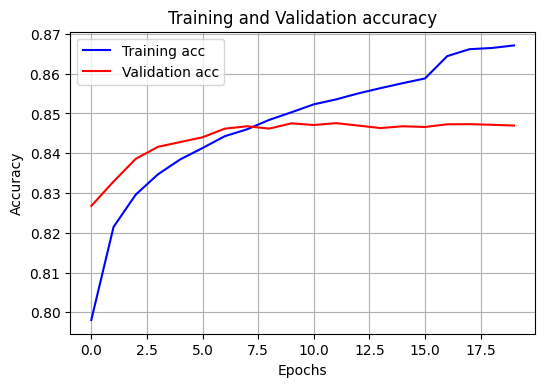

In [ ]:
acc,  val_acc  = history.history['accuracy'] , history.history['val_accuracy'] 
loss, val_loss = history.history['loss'], history.history['val_loss']
epochs = range(len(acc))
plt.figure(dpi=100)
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title('Training and Validation accuracy')
plt.grid()
plt.legend()

# plt.figure()

# plt.plot(epochs, loss, 'b', label='Training loss')
# plt.plot(epochs, val_loss, 'r', label='Validation loss')
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.title('Training and Validation loss')
# plt.grid()
# plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/tv_acc.png')
plt.show()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/tv_acc.png')

<Figure size 432x288 with 0 Axes>

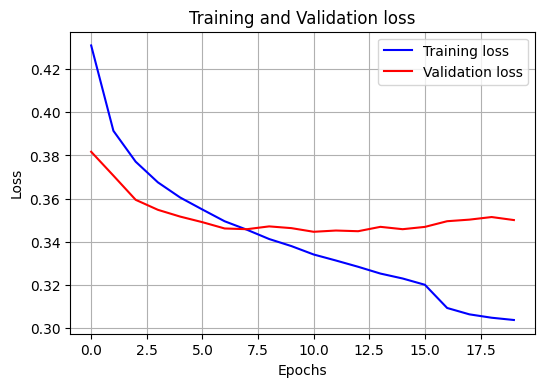

In [ ]:
loss, val_loss = history.history['loss'], history.history['val_loss']
epochs = range(len(acc))
plt.figure(dpi=100)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title('Training and Validation loss')
plt.grid()
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/tv_loss.png')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# def ConfusionMatrix(y_pred, y_test):
#     # Compute and plot the Confusion matrix
#     cf_matrix = confusion_matrix(y_test, y_pred)

#     categories  = ['Negative','Positive']
#     group_names = ['True Neg','False Pos', 'False Neg','True Pos']
#     group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

#     labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)

#     sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
#                 xticklabels = categories, yticklabels = categories)

#     plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
#     plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
#     plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

def ConfusionMatrix(y_pred, y_test):
    # Compute and plot the Confusion matrix
    plt.figure(dpi=100)
    cf_matrix = confusion_matrix(y_test, y_pred)

    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = [value for value in cf_matrix.flatten()]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
                xticklabels = categories, yticklabels = categories)

    
    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)
    


In [ ]:
# Predicting on the Test dataset.
y_pred = model.predict(X_test)

# Converting prediction to reflect the sentiment predicted.
y_pred = np.where(y_pred>=0.5, 1, 0)

# # Printing out the Evaluation metrics. 
# ConfusionMatrix(y_pred, y_test)

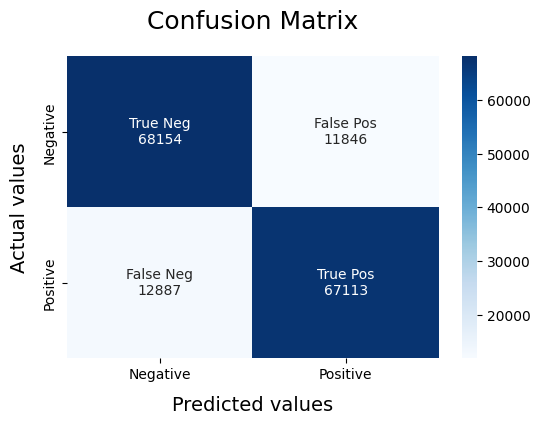

In [ ]:
# Printing out the Evaluation metrics. 
ConfusionMatrix(y_pred, y_test)

In [ ]:
# Print the evaluation metrics for the dataset.
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.85      0.85     80000
           1       0.85      0.84      0.84     80000

    accuracy                           0.85    160000
   macro avg       0.85      0.85      0.85    160000
weighted avg       0.85      0.85      0.85    160000



In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score,classification_report, confusion_matrix

In [ ]:
print('Accuracy:', np.round(accuracy_score(y_test, y_pred), 2))
print('F1 score:', np.round(f1_score(y_test, y_pred,average='weighted'),2))
print('Recall:', np.round(recall_score(y_test, y_pred,
                              average='weighted'),2))
print('Precision:', np.round(precision_score(y_test, y_pred,
                                    average='weighted'),2))

Accuracy: 0.85
F1 score: 0.85
Recall: 0.85
Precision: 0.85


In [ ]:
!pip install lime

     |████████████████████████████████| 275 kB 5.6 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=841bbdf52e91e75afe16c7b43ba307647cc146b618da032ae5e69b2009854926
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names=["Negative", "Positive"])

In [ ]:
def new_predict(texts):
    _seq = tokenizer.texts_to_sequences(texts)
    _text_data = pad_sequences(
        _seq, maxlen=input_length
    )
    return np.array([[float(1 - x), float(x)] for x in model.predict(_text_data)])

In [ ]:
test_data.text.iloc[-1]

'Finally  home after a long day that started at 04:15. Very sad to be going to a funeral tomorrow. The cancer had taken too many from us '

In [ ]:
X_test[-1]

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,  229,
         81,  149,    7,  165,   37,   19,  503,   27, 5433,  755,  121,
        111,    4,   26,   36,    4,    7, 2609,   98,    5, 1980,   65,
        943,   47,  311,   58,  164], dtype=int32)

In [ ]:
print(test_data["text"].iloc[-1]) # text 
print(test_data['sentiment'].iloc[-1]) # actual label
print(model.predict(X_test[-1].reshape(1, -1))) # model prediction
exp = explainer.explain_instance(
    test_data.text.iloc[-1], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

Finally  home after a long day that started at 04:15. Very sad to be going to a funeral tomorrow. The cancer had taken too many from us 
0
[[0.00230484]]


In [ ]:
print(test_data["text"].iloc[6])
print(test_data['sentiment'].iloc[6])
print(model.predict(X_test[6].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[6], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

i do try with you but i guess you just dont like me as much anymore 
0
[[0.05091164]]


In [ ]:
print(test_data["text"].iloc[552])
print(test_data['sentiment'].iloc[552])
print(model.predict(X_test[552].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[552], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

@myNAMEisJAYr damn jay u didnt finish ur cd yet?@?!??!?! 
0
[[0.02561917]]


In [ ]:
print(test_data["text"].iloc[190])
print(test_data['sentiment'].iloc[190])
print(model.predict(X_test[190].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[190], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

@_alii nahhh she'll be cool i reckon    that would be so awesomeeee  haha chat tomorrowwwww ilyy
1
[[0.96534824]]


In [ ]:
print(test_data["text"].iloc[411])
print(test_data['sentiment'].iloc[411])
print(model.predict(X_test[411].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[411], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

just finished the photo shoot   - what a day
1
[[0.95103997]]


In [ ]:
print(test_data["text"].iloc[1001])
print(test_data['sentiment'].iloc[1001])
print(model.predict(X_test[1001].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[1001], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

@MelissaHui Hey, Dad made some progress today! I'll tell u later 
1
[[0.9957541]]


In [ ]:
print(test_data["text"].iloc[1407])
print(test_data['sentiment'].iloc[1407])
print(model.predict(X_test[1407].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[1407], new_predict, num_features=10,
)
exp.show_in_notebook(text=True)

I'm never sleepy anymore until I actually go to sleep and then I don't want to wake up...someone SAVE me!! I need to go home 
0
[[0.04170536]]


In [ ]:
# Saving Word2Vec-Model
word2vec_model.wv.save('/content/drive/MyDrive/Colab Notebooks/Word2Vec-twitter-100')
word2vec_model.wv.save_word2vec_format('/content/drive/MyDrive/Colab Notebooks/Word2Vec-twitter-100-trainable')

# Saving the tokenizer
with open('/content/drive/MyDrive/Colab Notebooks/Tokenizer.pickle', 'wb') as file:
    pickle.dump(tokenizer, file)

In [ ]:
# Saving the TF-Model.
model.save('/content/drive/MyDrive/Colab Notebooks/Sentiment-BiLSTM')
model.save_weights("/content/drive/MyDrive/Colab Notebooks/weights")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Colab Notebooks/Sentiment-BiLSTM/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Colab Notebooks/Sentiment-BiLSTM/assets


In [ ]:
new_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/Sentiment-BiLSTM')

# Check its architecture
new_model.summary()

Model: "Sentiment_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 60, 100)           6000000   
                                                                 
 dropout (Dropout)           (None, 60, 100)           0         
                                                                 
 bidirectional (Bidirectiona  (None, 60, 256)          234496    
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 60, 256)          394240    
 nal)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 60, 256)           0         
                                                                 
 conv1d (Conv1D)             (None, 56, 100)       

In [ ]:
print(test_data["text"].iloc[400])
print(test_data['sentiment'].iloc[400])
print(new_model.predict(X_test[400].reshape(1, -1)))
exp = explainer.explain_instance(
    test_data.text.iloc[400], new_predict, num_features=10,
)
exp.show_in_notebook(text=False)

Just kidding. Fat ass just left. 
0
[[0.4901314]]


In [ ]:
# sklearn
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(dataset['processed_text'], dataset['sentiment'], stratify=dataset['sentiment']
                                                    ,test_size = 0.1, random_state = 0)
print(f'Data Split done.')

Data Split done.


In [ ]:
vectoriser = TfidfVectorizer(ngram_range=(1,2), max_features=500000)
vectoriser.fit(X_train1)
print(f'Vectoriser fitted.')
print('No. of feature_words: ', len(vectoriser.get_feature_names()))

Vectoriser fitted.


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


No. of feature_words:  500000


In [ ]:
X_train1 = vectoriser.transform(X_train1)
X_test1  = vectoriser.transform(X_test1)
print(f'Data Transformed.')

Data Transformed.


In [ ]:
def model_Evaluate(model):
    
    # Predict values for Test dataset
    y_pred1 = model.predict(X_test1)

    # Print the evaluation metrics for the dataset.
    print(classification_report(y_test1, y_pred1))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test1, y_pred1)

    print('Accuracy:', np.round(accuracy_score(y_test1, y_pred1), 2))
    print('F1 score:', np.round(f1_score(y_test1, y_pred1,average='weighted'),2))
    print('Recall:', np.round(recall_score(y_test1, y_pred1,average='weighted'),2))
    print('Precision:', np.round(precision_score(y_test1, y_pred1,average='weighted'),2), '\n')

    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = [value for value in cf_matrix.flatten()]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

              precision    recall  f1-score   support

           0       0.81      0.79      0.80     80000
           1       0.79      0.81      0.80     80000

    accuracy                           0.80    160000
   macro avg       0.80      0.80      0.80    160000
weighted avg       0.80      0.80      0.80    160000

Accuracy: 0.8
F1 score: 0.8
Recall: 0.8
Precision: 0.8 



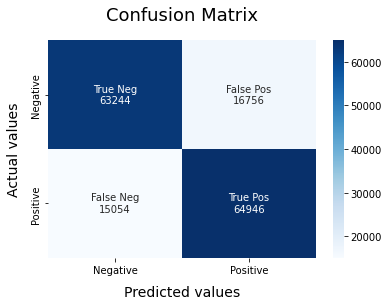

In [ ]:
BNBmodel = BernoulliNB(alpha = 2)
BNBmodel.fit(X_train1, y_train1)
model_Evaluate(BNBmodel)

              precision    recall  f1-score   support

           0       0.82      0.81      0.82     80000
           1       0.81      0.83      0.82     80000

    accuracy                           0.82    160000
   macro avg       0.82      0.82      0.82    160000
weighted avg       0.82      0.82      0.82    160000

Accuracy: 0.82
F1 score: 0.82
Recall: 0.82
Precision: 0.82 



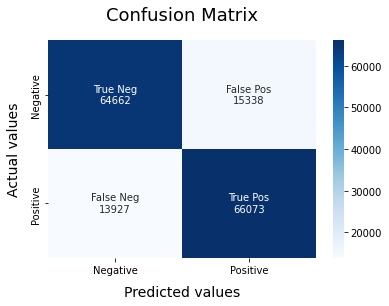

In [ ]:
SVCmodel = LinearSVC()
SVCmodel.fit(X_train1, y_train1)
model_Evaluate(SVCmodel)

              precision    recall  f1-score   support

           0       0.83      0.82      0.83     80000
           1       0.82      0.84      0.83     80000

    accuracy                           0.83    160000
   macro avg       0.83      0.83      0.83    160000
weighted avg       0.83      0.83      0.83    160000

Accuracy: 0.83
F1 score: 0.83
Recall: 0.83
Precision: 0.83 



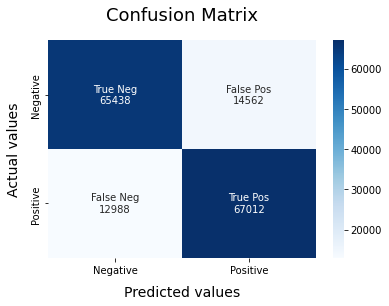

In [ ]:
LRmodel = LogisticRegression(C = 2, max_iter = 1000, n_jobs=-1)
LRmodel.fit(X_train1, y_train1)
model_Evaluate(LRmodel)